In [1]:
from glob import glob
import os
import pandas as pd
import torchaudio 
import torch
from torch.utils.data import Dataset
from torchvision.transforms import ToTensor
import numpy as np
import IPython.display as ipd
import torchaudio.transforms as transforms

In [2]:
torch.ones(1,80,241).shape

torch.Size([1, 80, 241])

In [48]:
########################CUSTOM FUNCTIONS ###############################
def get_num_parameters(model):
    return sum(p.numel() for p in model.parameters())

class string_to_int:
    def __init__(self,cutrange):
        self.cut_range=cutrange
        
    def __call__(self, sample):
        # Add your custom transformation logic here
        transformed_sample =[]
        for i in range(self.cut_range[0],self.cut_range[1]):
            transformed_sample.append(int(sample[i]))  # Example transformation (multiplying by 2)
        transformed_sample=torch.tensor(transformed_sample)
        return transformed_sample/10



class string_to_int2:
    def __init__(self,cutrange):
        self.cut_range=cutrange
        
    def __call__(self, sample):
        # Add your custom transformation logic here
        
        sample=int(sample[self.cut_range[0]:self.cut_range[1]])
              # Example transformation (multiplying by 2)
        transformed_sample=torch.tensor(sample)
        return transformed_sample/100



class onehot:
    def __init__(self,num_classes):
        self.class_number=num_classes
        
    def __call__(self, sample):
        # Add your custom transformation logic here
        transformed_sample = torch.eye(self.class_number)[int(sample[4:7])]  # Example transformation (multiplying by 2)
        
        return transformed_sample.reshape(1,self.class_number)



class mel_motherfucker():
    def __call__(self,audio_tensor,sample_rate=16000):
        audio_tensor = audio_tensor.unsqueeze(0)
    
        # Initialize MelSpectrogram transformation
        mel_spectrogram = torchaudio.transforms.MelSpectrogram(sample_rate=sample_rate,n_mels=80)
    
        # Apply MelSpectrogram transformation to the audio tensor
        mel_output = mel_spectrogram(audio_tensor)
    
        # Convert the output to decibels
        mel_db = torchaudio.transforms.AmplitudeToDB()(mel_output)
        return mel_db

class spectomf():
    def __call__(self,waveform,sample_rate=16000, n_fft=800, hop_length=80, win_length=800,directtensor=False):
        
        #print(sample_rate)
        
        spectrogram_transform = transforms.Spectrogram(
            n_fft=n_fft,
            hop_length=hop_length,
            win_length=win_length
        )
        waveform=waveform.clone()
        spectrogram = spectrogram_transform(waveform)
        spectrogram = torchaudio.transforms.AmplitudeToDB(stype='magnitude')(spectrogram)
        return spectrogram

class reversespcetomf():

    def __call__(spectrogram, n_fft=800, hop_length=80, win_length=800):
        spectrogram = torchaudio.functional.DB_to_amplitude(spectrogram,1.0,0.5)
        inverse_transform = transforms.GriffinLim(
            n_fft=n_fft,
            hop_length=hop_length,
            win_length=win_length
        )
        waveform = inverse_transform(spectrogram)
        return waveform
def revspecto2(spectrogram, n_fft=800, hop_length=80, win_length=800):
        spectrogram = torchaudio.functional.DB_to_amplitude(spectrogram,1.0,0.5)
        inverse_transform = transforms.GriffinLim(
            n_fft=n_fft,
            hop_length=hop_length,
            win_length=win_length
        )
        waveform = inverse_transform(spectrogram)
        return waveform

import torch
import torchaudio
import torchaudio.transforms as transforms
import matplotlib.pyplot as plt
%matplotlib inline

def plot_mel_spectrogram(mel_spec, sample_rate=16000):

    # Convert the output to decibels
    mel_db = mel_spec

    # Convert torch tensor to numpy array for plotting
    mel_db_np = mel_db.squeeze(0).numpy()

    # Plot the Mel Spectrogram
    plt.figure(figsize=(10, 4))
    plt.imshow(mel_db_np, origin='lower', aspect='auto', cmap='viridis')
    plt.xlabel('Time')
    plt.ylabel('Mel Bins')
    plt.title('Mel Spectrogram')
    plt.colorbar(format='%+2.0f dB')
    plt.show()
    
import torch
import torch.nn.functional as F
def pad601(x):
# Create a tensor


# Pad the tensor
 return  F.pad(x, pad=(1, 0, 1, 0), mode='constant', value=0)

def min_max_scale(tensor):
    min_val = torch.min(tensor)
    max_val = torch.max(tensor)
    scaled_tensor = (tensor - min_val) / (max_val - min_val)
    return scaled_tensor
# Create a sample tensor
def reverse_min_max_scale(scaled_tensor, refrence_tensor):
    min_val = torch.min(refrence_tensor)
    max_val = torch.max(refrence_tensor)
    reversed_tensor = (scaled_tensor * (max_val - min_val)) + min_val
    return reversed_tensor

In [15]:
mel=mel_motherfucker()
specto=spectomf()
#revspecto=reversespcetomf()

In [4]:
import torch
import torch.nn.functional as F
def pad601(x):
# Create a tensor


# Pad the tensor
 return  F.pad(x, pad=(1, 0, 1, 0), mode='constant', value=0)

# Output: torch.Size([1, 401, 601])

In [6]:
revspecto2(torch.rand(401,601))

tensor([ 0.0042, -0.0241, -0.0913,  ...,  0.0577, -0.0141, -0.1012])

In [4]:
x=torch.rand(1,48000)
specto(x).shape

torch.Size([1, 401, 601])

In [7]:
def get_subclass(PATH,instr1,subclass):
    return glob(PATH+instr1+subclass+"*")
    
def get_intersection(instr1,instr2,PATH1,PATH2):
    instr_1_lables=glob(PATH1+instr1+"*")
    instr_2_labels=glob(PATH2+instr2+"*")
    notes=[]
    
    for i in instr_1_lables:
        notes.append(i[-19:-4])
    intersection=[]
    
    for i in instr_2_labels:
        if i[-19:-4] in notes: 
            intersection.append(i[-19:-4])
            
    data_volume=len(intersection)
    instr_1_notes=[]
    instr_2_notes=[]
    for i in intersection:
        instr_1_notes.append(PATH1+instr1+"_"+i+".wav")
        instr_2_notes.append(PATH2+instr2+"_"+i+".wav")
    return instr_1_notes,instr_2_notes,data_volume,intersection       

In [8]:
#########################full#############################
class nsynth(Dataset):
    def __init__(self, annotations_file, audio_dir, transform=None, target_transform=None):
        super(nsynth, self).__init__()
        self.audio_labels = annotations_file
        self.audio_dir = audio_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.audio_labels)

    def __getitem__(self, idx):
        
        
        audio_path = self.audio_dir+ self.audio_labels[idx]+'.wav'
        audio,sample_rate = torchaudio.load(audio_path)
        audio=audio[:,:48000]
        label = self.audio_labels[idx]
        if self.transform:
            audio = self.transform(audio)
        if self.target_transform:
            label = self.target_transform(label)
    
        return audio[0],label.unsqueeze(0)
    def show(self,idx):
        audio_path = self.audio_dir+ self.audio_labels[idx]+'.wav'
        audio,sample_rate = torchaudio.load(audio_path)
        return ipd.Audio(data=audio,rate=16000)

In [9]:
intinator=string_to_int([4,7])
intinator2=string_to_int2([4,7])

In [10]:
glob(PATH1+'bass_synthetic'+"*")

NameError: name 'PATH1' is not defined

In [12]:
glob('D:/nsynth/New_folder/augmented_bass/*')

['D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_000.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_050.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_100.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_150.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_200.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_250.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-025_300.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_000.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_050.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_100.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_150.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_200.wav',
 'D:/nsynth/New_folder/augmented_bass\\bass_synthetic_001-009-050_250.wav',
 'D:/nsynth/

In [13]:
glob('D:/nsynth/New_folder/augmented_keyboard/*')

['D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_000.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_050.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_100.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_150.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_200.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_250.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-025_300.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-050_000.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-050_050.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-050_100.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-050_150.wav',
 'D:/nsynth/New_folder/augmented_keyboard\\keyboard_synthetic_001-036-050_20

In [11]:
PATH1="D:/nsynth/New_folder/augmented_bass/"
PATH2="D:/nsynth/New_folder/augmented_keyboard/"
instr1,instr2,data_volume,intersection=get_intersection("bass_synthetic","keyboard_synthetic",PATH1,PATH2)

In [12]:
data_volume

1785

In [16]:
#OneHot=CustomTransform(112)
PATH="D:/nsynth/nsynth-train/audio/"

_,_,data_volume,intersection=get_intersection("bass_synthetic","keyboard_synthetic",PATH1,PATH2)
nsynth_bass_data=nsynth(intersection,PATH1+"bass_synthetic_",transform=specto,target_transform=intinator2)
nsynth_keyboard_data=nsynth(intersection,PATH2+"keyboard_synthetic_",transform=specto,target_transform=intinator2)
#nsynth_keyboard_data=nsynth(intersection,PATH+"keyboard_synthetic_",transform=mel,target_transform=intinator2)
print(data_volume)
print(nsynth_bass_data[10])
#print(nsynth_keyboard_data[10])

1785
(tensor([[  29.1302,   29.9653,   34.0599,  ...,   36.6859,   41.5457,
           44.6159],
        [  15.8436,   28.2664,   34.8455,  ...,   38.0614,   42.9670,
           43.0925],
        [  44.1442,   43.2959,   40.0841,  ...,   49.0181,   55.7096,
           57.9213],
        ...,
        [-136.4830, -137.9046, -142.2181,  ..., -111.2343, -105.8038,
         -104.1496],
        [-144.2501, -145.8256, -151.0127,  ..., -112.1937, -106.1423,
         -104.2948],
        [-151.1025, -153.4080, -160.5226,  ..., -110.3212, -105.3819,
         -103.8680]]), tensor([0.3600]))


In [42]:
nsynth_bass_data[10][0]

torch.Size([1, 401, 601])

In [19]:
intersection[245:256]

['001-085-025',
 '001-085-050',
 '001-085-075',
 '001-085-100',
 '001-085-127',
 '001-086-025',
 '001-086-050',
 '001-086-075',
 '001-086-100',
 '001-086-127',
 '002-036-025']

In [8]:
OneHot=onehot(120)

In [9]:
###############DATA WRAPING ######################
from torch.utils.data import DataLoader,Subset
start_index = 0
end_index = 255 - 1
subset_dataset_bass = Subset(nsynth_bass_data, range(start_index, end_index + 1))
subset_dataset1_keyboard = Subset(nsynth_bass_data, range(start_index, end_index + 1))

train_dataloader_bass = DataLoader(subset_dataset_bass, batch_size=4, shuffle=False)
train_dataloader_keyboard = DataLoader(subset_dataset1_keyboard, batch_size=4, shuffle=False)



In [17]:
from torch.utils.data import DataLoader
train_dataloader_bass = DataLoader(nsynth_bass_data, batch_size=4, shuffle=False)
train_dataloader_keyboard = DataLoader(nsynth_keyboard_data, batch_size=4, shuffle=False)

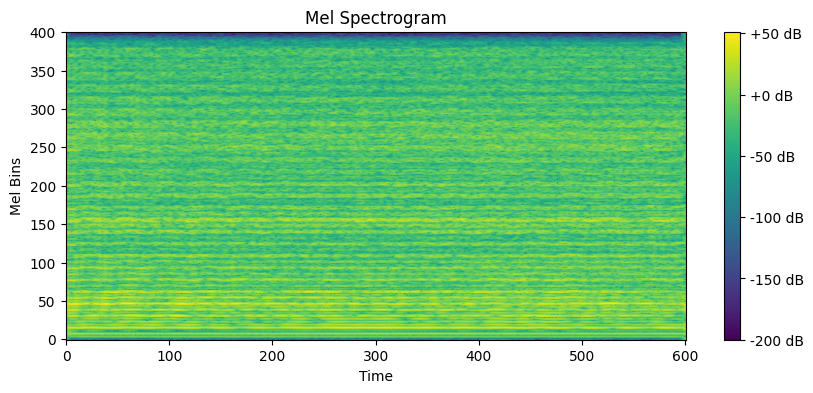

In [36]:
x=20
plot_mel_spectrogram(nsynth_keyboard_data[x][0], sample_rate=16000)
nsynth_keyboard_data.show(x)

In [ ]:
torch.rand(1,2,34,56).to("cuda")

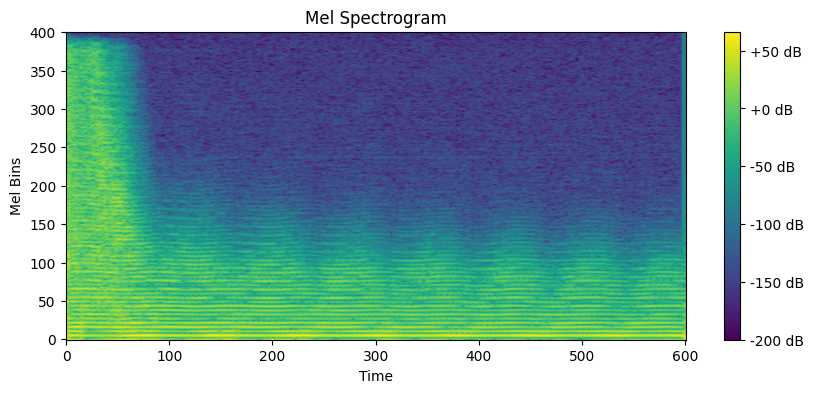

In [41]:
x=237
plot_mel_spectrogram(nsynth_bass_data[x][0], sample_rate=16000)
nsynth_bass_data.show(x)

In [23]:
nsynth_bass_data[0][0][:400,:600].shape

torch.Size([400, 600])

In [101]:
nn.InstanceNorm1d(1)(torch.rand(4,1,512)).shape

torch.Size([4, 1, 512])

In [ ]:
########################################MODEL INITIALIZATION START ############################################

                        __     __   _       _ __  _       ___             __  _                     __             __ 
   ____ ___  ____  ____/ /__  / /  (_)___  (_) /_(_)___ _/ (_)___  ____ _/ /_(_)___  ____     _____/ /_____ ______/ /_
  / __ `__ \/ __ \/ __  / _ \/ /  / / __ \/ / __/ / __ `/ / /_  / / __ `/ __/ / __ \/ __ \   / ___/ __/ __ `/ ___/ __/
 / / / / / / /_/ / /_/ /  __/ /  / / / / / / /_/ / /_/ / / / / /_/ /_/ / /_/ / /_/ / / / /  (__  ) /_/ /_/ / /  / /_  
/_/ /_/ /_/\____/\__,_/\___/_/  /_/_/ /_/_/\__/_/\__,_/_/_/ /___/\__,_/\__/_/\____/_/ /_/  /____/\__/\__,_/_/   \__/  
                                                                                                                      


In [23]:
import torch
import torch.nn as nn
import torch.nn.functional as F

# Define the VAE model
class VAE(nn.Module):
    def __init__(self, input_size, latent_size):
        super(VAE, self).__init__()
        self.input_size = input_size
        self.latent_size = latent_size
        
        self.encoder = nn.Sequential(
            nn.Conv2d(1,1,kernel_size=1,stride=1,padding=0),
            nn.ReLU(),
            nn.Conv2d(1, 32, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            #(64,39,120)
            nn.Conv2d(32, 64, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2,stride=2,padding=1),

            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
            
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.InstanceNorm2d(256),
            nn.ReLU(),
            
            nn.MaxPool2d(2,stride=2,padding=1),
            
            nn.Flatten(),
            nn.Linear(256*7*10, 512),  # Adjusted input size
            nn.InstanceNorm1d(4),
            nn.ReLU(),
        )
        self.mu = nn.Linear(512, latent_size)
        self.log_var = nn.Linear(512, latent_size)
        
        # Decoder
        self.decoder = nn.Sequential(
            nn.Linear(latent_size, 512),
            nn.InstanceNorm1d(4),
            nn.ReLU(),
            
            nn.Linear(512, 256*7*10),  # Adjusted output size
            nn.InstanceNorm1d(4),
            nn.ReLU(),
            
            nn.Unflatten(1, (256, 7, 10)),  # Adjusted output shape
            nn.ConvTranspose2d(256, 128, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(128),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 128, kernel_size=2, stride=2, padding=1, output_padding=0),
            
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(64),
            nn.ReLU(),
            
            nn.ConvTranspose2d(64, 64, kernel_size=2, stride=2, padding=1, output_padding=0),
            #nn.ConvTranspose2d(64, 64, kernel_size=3, stride=2, padding=1, output_padding=1),
            #nn.InstanceNorm2d(64),
            #nn.ReLU(),
            
            nn.ConvTranspose2d(64, 32, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.InstanceNorm2d(32),
            nn.ReLU(),
            
            nn.ConvTranspose2d(32, 1, kernel_size=3, stride=2, padding=1, output_padding=1),
            nn.LeakyReLU(negative_slope=0.2)
            #nn.Sigmoid(),
        )
    def encode(self, x):
        h = self.encoder(x)
        return self.mu(h), self.log_var(h)

    def reparameterize(self, mu, log_var):
        std = torch.exp(0.5 * log_var)
        eps = torch.randn_like(std)
        return mu + eps * std

    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, log_var = self.encode(x)
        
        z = self.reparameterize(mu, log_var)
        x_recon = self.decode(z)
        return x_recon[:,:,:400,:600], mu, log_var
    def forward2(self,x):
        x=self.encoder(x)
        return x

# Instantiate the VAE model
input_size = (1, 400, 600)
latent_size = 32
vae = VAE(input_size, latent_size)

# Move the model to CUDA if available
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
vae = vae.to(device)

# Example usage
batch_size = 4
x = torch.randn(batch_size, *input_size).to(device)
recons_x, mu, log_var = vae(x)

#print(vae(x)[0].shape)
# Training loop (not shown)
# ...
vae.forward2(x).shape

torch.Size([4, 512])

In [24]:
recons_x.shape

torch.Size([4, 1, 400, 600])

In [136]:
get_num_parameters(vae)

19275779

In [ ]:
#############################################################################MODEL INITIALIZE END #####################################

                        __     __   _       _ __  _       ___             __  _                               __
   ____ ___  ____  ____/ /__  / /  (_)___  (_) /_(_)___ _/ (_)___  ____ _/ /_(_)___  ____     ___  ____  ____/ /
  / __ `__ \/ __ \/ __  / _ \/ /  / / __ \/ / __/ / __ `/ / /_  / / __ `/ __/ / __ \/ __ \   / _ \/ __ \/ __  / 
 / / / / / / /_/ / /_/ /  __/ /  / / / / / / /_/ / /_/ / / / / /_/ /_/ / /_/ / /_/ / / / /  /  __/ / / / /_/ /  
/_/ /_/ /_/\____/\__,_/\___/_/  /_/_/ /_/_/\__/_/\__,_/_/_/ /___/\__,_/\__/_/\____/_/ /_/   \___/_/ /_/\__,_/   
                                                                                                                


In [16]:
nsynth_bass_data[0][0].shape

torch.Size([1, 80, 241])

In [ ]:

   __             _       _            
  / /__________ _(_)___  (_)___  ____ _
 / __/ ___/ __ `/ / __ \/ / __ \/ __ `/
/ /_/ /  / /_/ / / / / / / / / / /_/ / 
\__/_/   \__,_/_/_/ /_/_/_/ /_/\__, /  
                              /____/   


In [39]:

    
    
for data1,data2 in zip(train_dataloader_bass,train_dataloader_keyboard):
        z=data1[0].to(device)
        print(z[:,:400,:600].unsqueeze(1).shape)
        break


torch.Size([4, 1, 400, 600])


In [20]:
device="cuda"


In [32]:
model=model.to(device)

NameError: name 'model' is not defined

In [21]:
for epoch in range(10):
    running_loss = 0.0
    for  data ,target in zip(train_dataloader_bass,train_dataloader_keyboard):
        x = data[0][:,:400,:600].unsqueeze(1).to(device)  # Move data to the device
        x = (x-x.min())/(x.max()-x.min())
        y = target[0][:,:400,:600].unsqueeze(1).to(device)  # Move data to the device
        y = (y-y.min())/(y.max()-y.min())
        print(y.shape)
        print(x.shape)
        break
    break

torch.Size([4, 1, 400, 600])
torch.Size([4, 1, 400, 600])


In [22]:
normalizer=nn.BatchNorm2d(1)
normalizer=normalizer.to(device)

NameError: name 'nn' is not defined

In [120]:
def unnorm(x):
    mu = normalizer.running_mean
    sigma = torch.sqrt(normalizer.running_var + normalizer.eps)
    x_unnorm = x.to(device) * sigma + mu
    return x_unnorm

In [44]:
import torch.optim as optim
from torch.optim.lr_scheduler import StepLR
# Set up the loss function and optimizer
criterion = nn.MSELoss(reduction='sum')
optimizer = optim.Adam(vae.parameters(), lr=0.000005)
#scheduler = StepLR(optimizer, step_size=1, gamma=0.1)
# Training loop
num_epochs = 3
for epoch in range(num_epochs):
    running_loss = 0.0
    for  data ,target in zip(train_dataloader_bass,train_dataloader_keyboard):
        x = data[0][:,:400,:600].unsqueeze(1).to(device) 
        x = (x-x.min())/(x.max()-x.min())# Move data to the device
        #x=normalizer(x)
        y = target[0][:,:400,:600].unsqueeze(1).to(device)  # Move data to the device
        #y = normalizer(y)
        # Forward pass
        y = (y-y.min())/(y.max()-y.min())
        x_recon, mu, log_var = vae(x)

        # Compute the reconstruction loss
        recon_loss = criterion(x_recon, y)

        # Compute the KL divergence loss
        kl_div = -0.5 * torch.sum(1 + log_var - mu.pow(2) - log_var.exp())

        # Combine the losses
        loss = recon_loss + kl_div

        # Backpropagation
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        #scheduler.step()
        #running_loss += loss.item()
    print(loss)
    
    

    # Validation or testing (not shown)
    # ...

print("Training finished!")

tensor(683.2604, device='cuda:0', grad_fn=<AddBackward0>)
tensor(667.5065, device='cuda:0', grad_fn=<AddBackward0>)
tensor(655.4500, device='cuda:0', grad_fn=<AddBackward0>)
Training finished!


In [31]:
print('done')

done


In [ ]:

   __            __ 
  / /____  _____/ /_
 / __/ _ \/ ___/ __/
/ /_/  __(__  ) /_  
\__/\___/____/\__/  
                    


In [35]:
vae(torch.rand(4,1,80,241).to(device))

(tensor([[[[9.3072e-01, 8.9273e-01, 8.7912e-01,  ..., 3.9542e-01,
            4.7003e-01, 4.5949e-01],
           [9.6064e-01, 9.7719e-01, 9.5351e-01,  ..., 4.0492e-01,
            5.3867e-01, 4.6750e-01],
           [8.9823e-01, 9.3213e-01, 8.7084e-01,  ..., 2.5896e-01,
            3.9883e-01, 3.0277e-01],
           ...,
           [1.0908e-04, 2.5977e-05, 5.1703e-05,  ..., 2.2583e-04,
            5.5134e-05, 2.9235e-04],
           [1.3662e-03, 2.3924e-04, 9.9007e-04,  ..., 1.1350e-03,
            1.3025e-03, 2.8460e-03],
           [4.0677e-04, 4.2789e-05, 1.7418e-04,  ..., 4.5939e-04,
            1.3420e-04, 1.3873e-03]]],
 
 
         [[[7.2743e-01, 9.1658e-01, 9.8038e-01,  ..., 9.9735e-01,
            9.9624e-01, 9.8395e-01],
           [9.4217e-01, 9.9384e-01, 9.9383e-01,  ..., 9.9832e-01,
            9.9867e-01, 9.9658e-01],
           [9.0795e-01, 9.5861e-01, 9.6433e-01,  ..., 9.2697e-01,
            9.9304e-01, 9.8645e-01],
           ...,
           [9.9534e-01, 9.9655e-01,

In [57]:
x=normalizer(nsynth_keyboard_data[i][0][:400,:600].reshape(1,1,400,600).to(device))

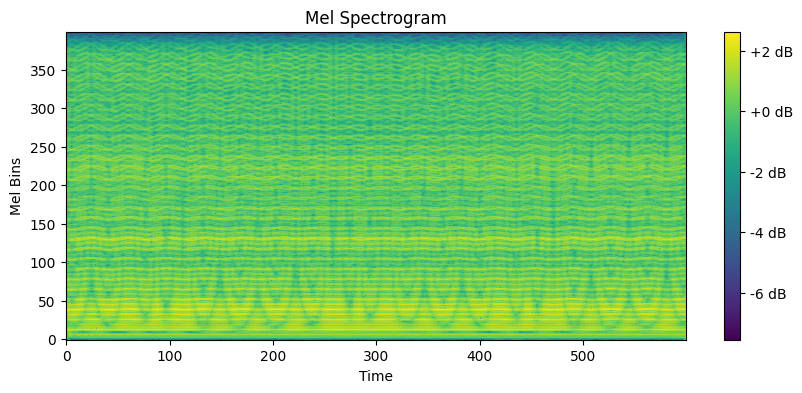

In [60]:
plot_mel_spectrogram(x.squeeze(0).to('cpu').detach())

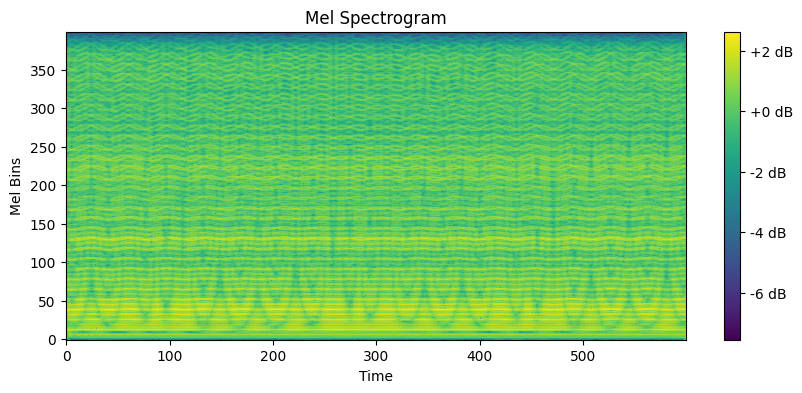

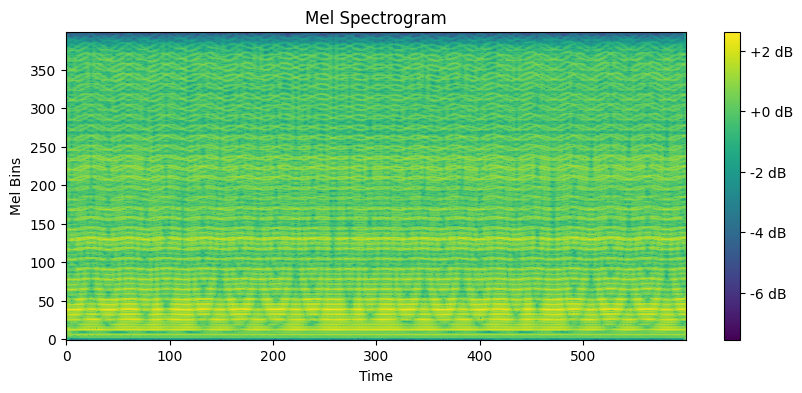

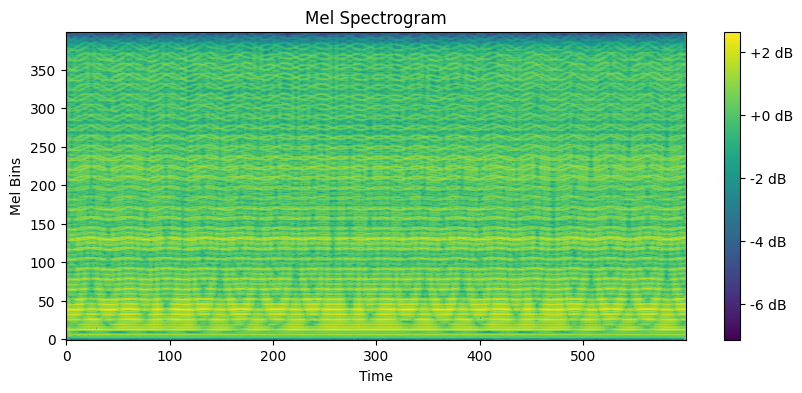

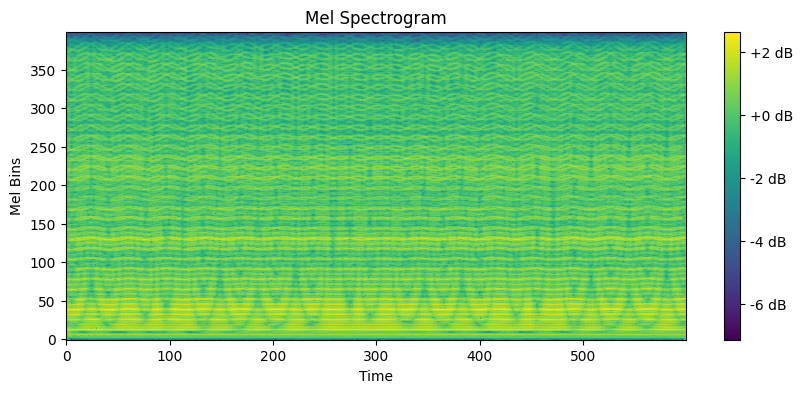

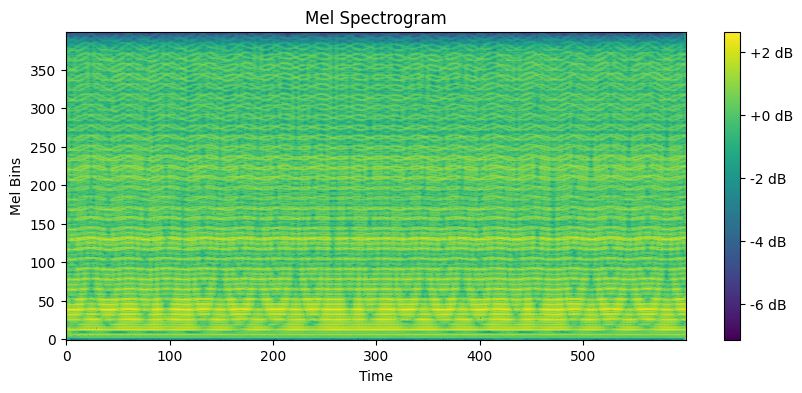

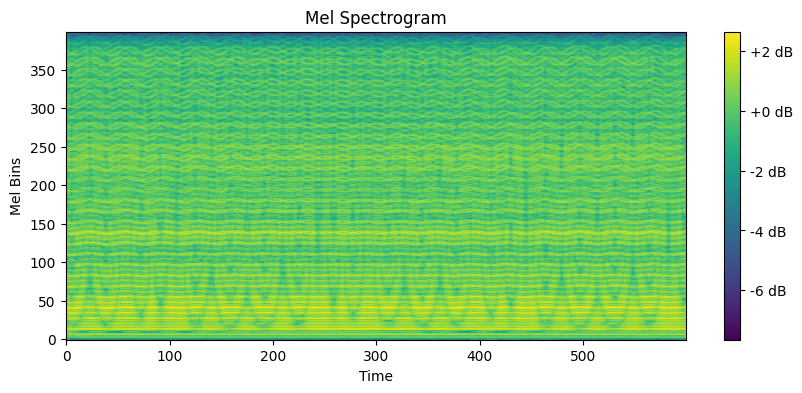

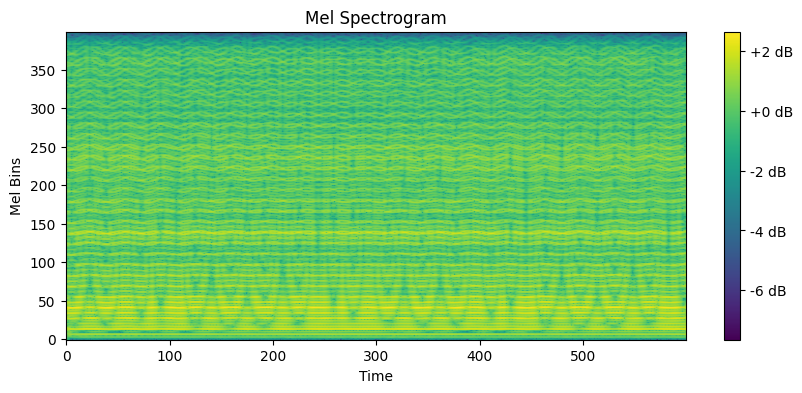

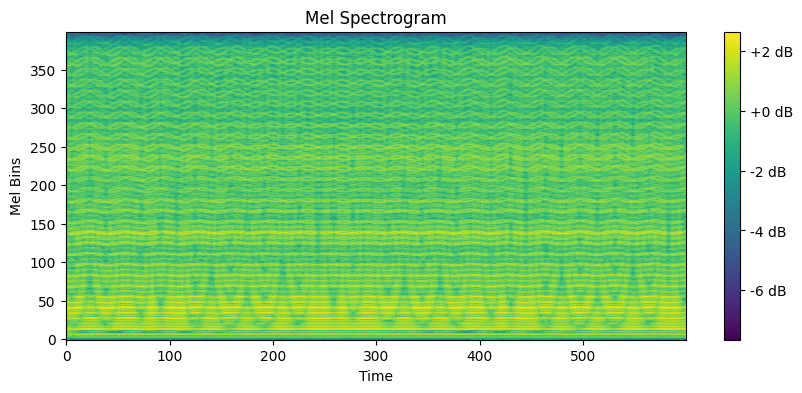

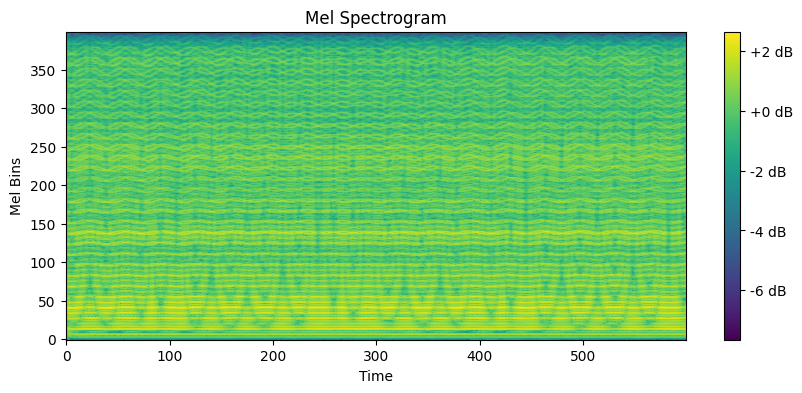

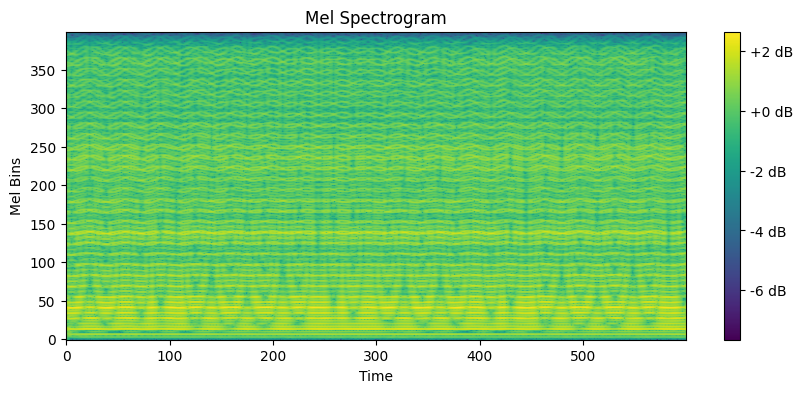

In [62]:
for i in range(10):
    plot_mel_spectrogram(normalizer(nsynth_keyboard_data[i][0][:400,:600].reshape(1,1,400,600).to(device)).to('cpu').reshape(400,600).detach())

In [56]:
x=vae(min_max_scale(nsynth_keyboard_data[34][0][:400,:600].reshape(1,1,400,600).to(device)))[0].to('cpu')

C:\Users\ASUS\.conda\envs\pytorchtest\Lib\site-packages\torch\nn\modules\instancenorm.py:80: UserWarning: input's size at dim=0 does not match num_features. You can silence this warning by not passing in num_features, which is not used because affine=False
  warnings.warn(f"input's size at dim={feature_dim} does not match num_features. "


In [47]:
ipd.Audio(revspecto2(pad601(x)).reshape(48000).detach(),rate=16000)

In [84]:
x=revspecto2(min_max_scale(nsynth_keyboard_data[34][0].reshape(1,1,401,601).to(device)).to('cpu'))

#ipd.Audio(reverse_min_max_scale(x,nsynth_keyboard_data[34][0].reshape(1,1,400,600)).reshape(1,48000).detach().to('cpu'),rate=16000)

torch.Size([1, 1, 48000])

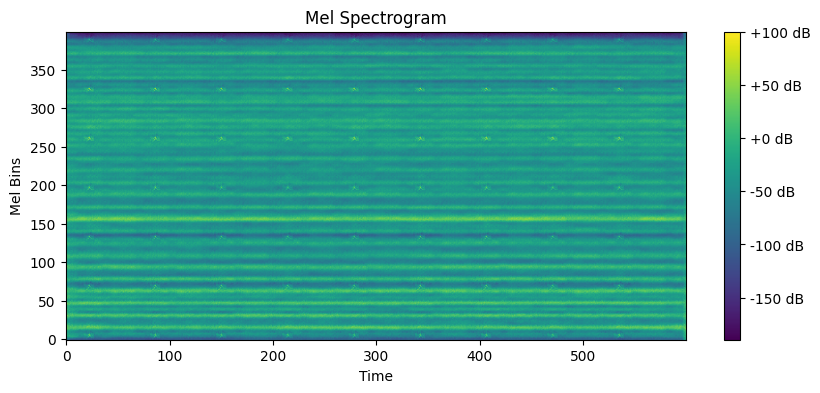

In [61]:
plot_mel_spectrogram(reverse_min_max_scale(x,nsynth_keyboard_data[34][0]).squeeze().detach())

In [51]:
x=min_max_scale(nsynth_keyboard_data[34][0].reshape(1,1,401,601))

In [52]:
y=reverse_min_max_scale(x,nsynth_keyboard_data[34][0])

In [94]:
nsynth_bass_data.show(501)

In [97]:
nsynth_keyboard_data.show(1000)

In [95]:
x=vae(min_max_scale(nsynth_bass_data[1000][0][:400,:600].reshape(1,1,400,600).to(device)))[0].to('cpu')

C:\Users\ASUS\.conda\envs\pytorchtest\Lib\site-packages\torch\nn\modules\instancenorm.py:80: UserWarning: input's size at dim=0 does not match num_features. You can silence this warning by not passing in num_features, which is not used because affine=False
  warnings.warn(f"input's size at dim={feature_dim} does not match num_features. "


In [96]:
ipd.Audio(revspecto2(pad601(reverse_min_max_scale(x,nsynth_bass_data[105][0]))).squeeze(0).detach(),rate=16000)

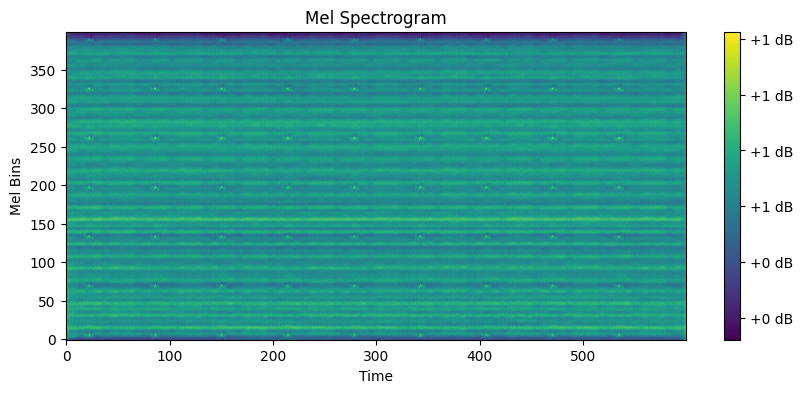

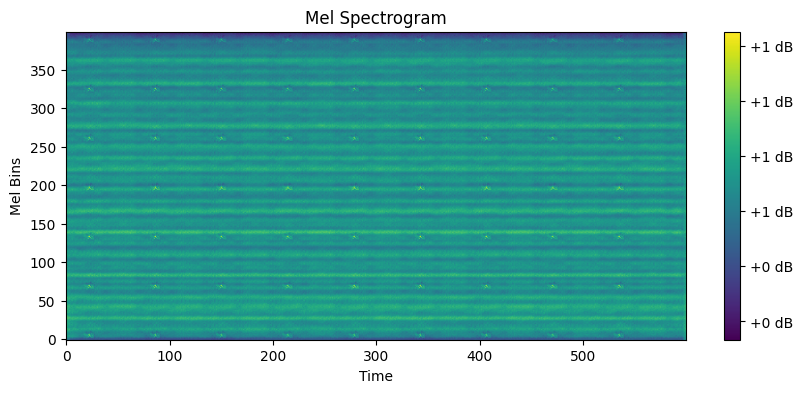

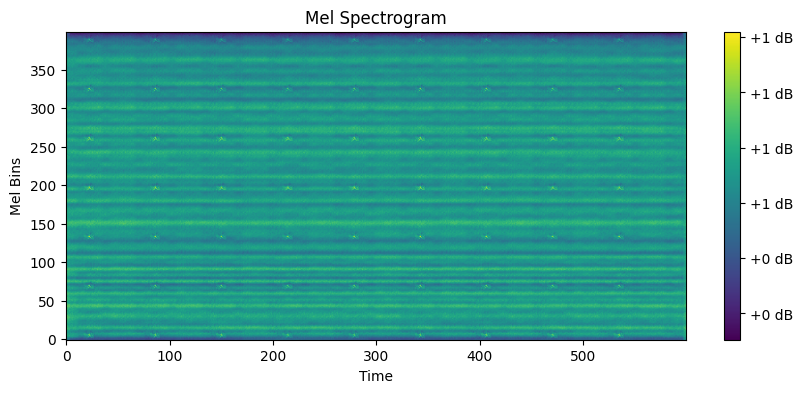

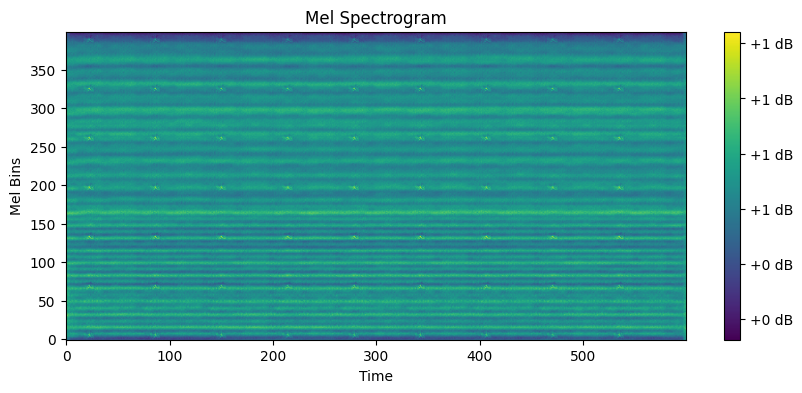

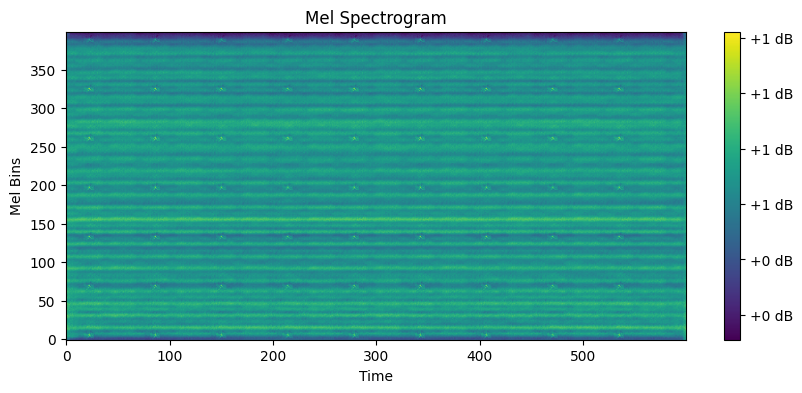

...

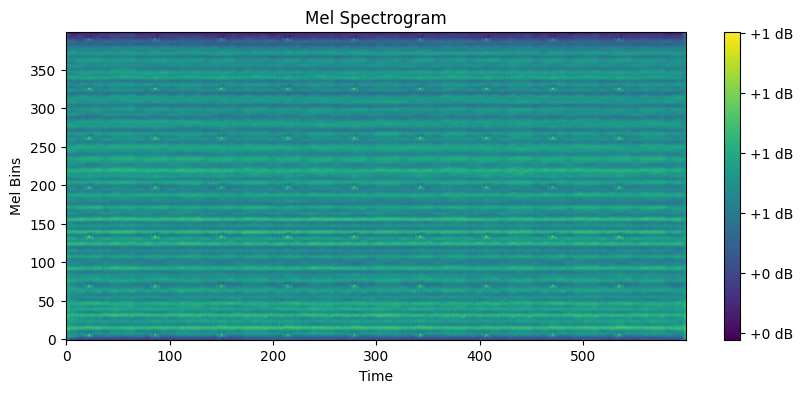

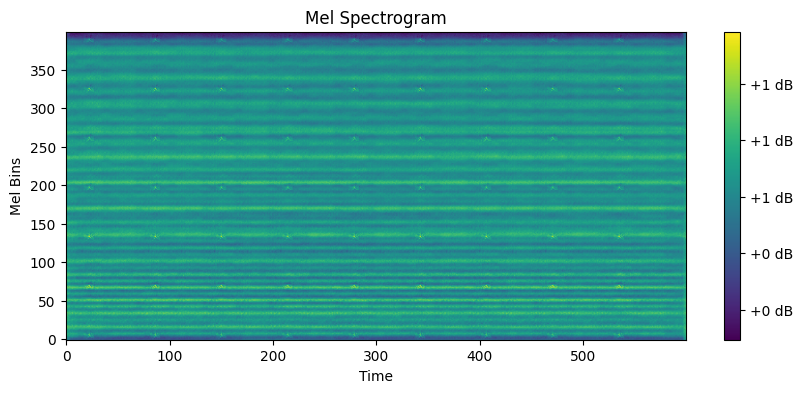

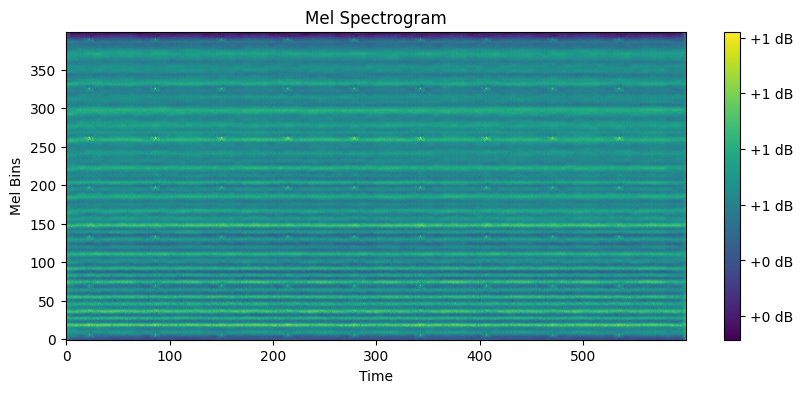

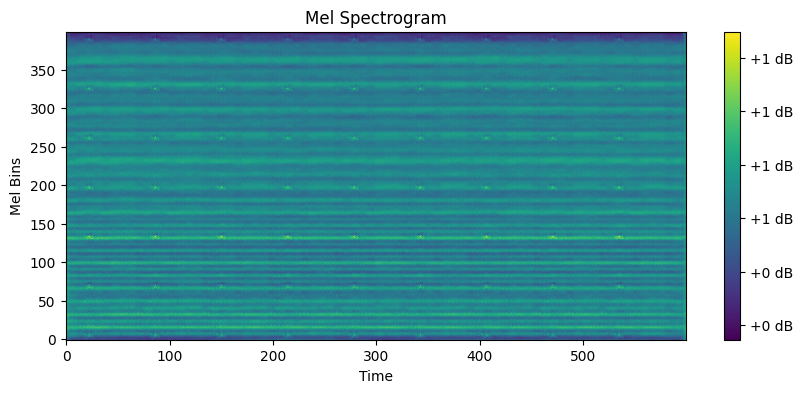

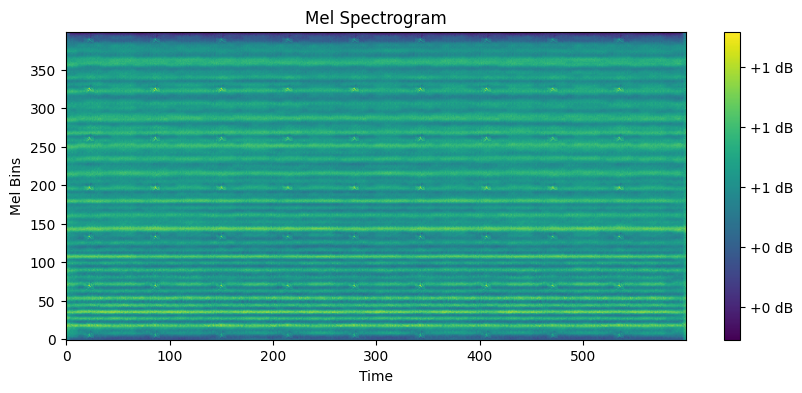

In [75]:
for i in range(160,180):
    plot_mel_spectrogram((vae(min_max_scale(nsynth_bass_data[i*3][0][:400,:600].reshape(1,1,400,600).to(device))))[0].to('cpu').reshape(400,600).detach())

In [ ]:
class mel_motherfucker():
    def __call__(self,audio_tensor,sample_rate=16000):
        audio_tensor = audio_tensor.unsqueeze(0)
    
        # Initialize MelSpectrogram transformation
        mel_spectrogram = torchaudio.transforms.MelSpectrogram(sample_rate=sample_rate,n_mels=80)
    
        # Apply MelSpectrogram transformation to the audio tensor
        mel_output = mel_spectrogram(audio_tensor)
    
        # Convert the output to decibels
        mel_db = torchaudio.transforms.AmplitudeToDB()(mel_output)
        return mel_db
mel=mel_motherfucker()

In [79]:
mel_spectrogram = torchaudio.transforms.MelSpectrogram(sample_rate=16000,n_mels=80)
    
        # Apply MelSpectrogram transformation to the audio tensor
mel_output = mel_spectrogram(torch.rand(1,48000))
inverse_specto=torchaudio.transforms.InverseMelScale(sample_rate=16000,n_mels=80,n_stft=320)
inverse_specto(mel_output).shape

torch.Size([1, 320, 241])

In [ ]:
mel_spectrogram.

In [ ]:
ipd.Audio(mel_to_audio(nsynth_keyboard_data[0][0],sample_rate=16000,),rate=16000)

In [41]:
torch.save(vae,'./bestversionMMscaleing.pth')


In [42]:
torch.save(vae.state_dict(),'./bestversionMMscaleing_parameters.pth')

In [ ]:
###############RANDOM INPUT TEST ##############################
y=model((torch.rand(1,1,160,241)).to('cuda'))
y

In [143]:
#####################DATASET INPUT TEST ###############################
def accuracy():
    result=[]
    for i in range(0,100):
        #print( model(nsynth_bass_data[i][0].reshape(1,1,80,241).to('cuda')).argmax(),nsynth_bass_data[i][1].argmax())
        x=model(nsynth_bass_data[i*4][0].reshape(1,1,80,241).to('cuda')).argmax()
        y=nsynth_bass_data[i*4][1].argmax()
        #result.append(x==y)
        result.append(x<y+20 and x>y-20)
    return sum(result)
accuracy()

tensor(45, device='cuda:0')